In [15]:
#%matplotlib notebook


import numpy as np

plt.rc('font', family='serif')

def show_gif(fname):
    import base64
    from IPython import display
    with open(fname, 'rb') as fd:
        b64 = base64.b64encode(fd.read()).decode('ascii')
    return display.HTML(f'<img src="data:image/gif;base64,{b64}" />')

In [16]:
from multidynet.datasets import load_primaryschool
Y, grade, gender, layer_labels, time_labels = load_primaryschool()

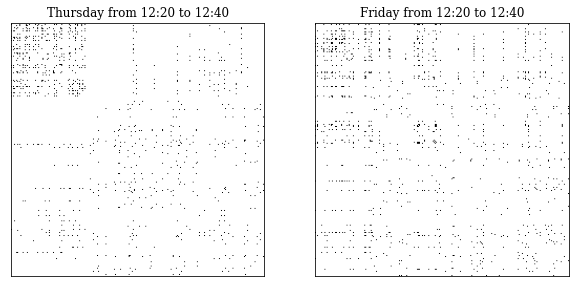

In [3]:
from dynetlsm.plots import plot_adjacency_matrix

k = 0
t = 10
node_id = 48

fig, axes = plt.subplots(nrows=1, ncols=2, sharey=True, sharex=True, figsize=(10, 6))

for k, ax in enumerate(axes.flat):
    #Yk = Y[k, :, node_id].T
    ax.imshow(Y[k,t], cmap='Greys')#cmap=plt.cm.tab20c)
    #ax.set_xlabel('Month')
    #ax.set_ylabel('Country')
    ax.set_title("{} from {}".format(layer_labels[k], time_labels[t]), fontsize=12)

    ax.set_yticks([])
    ax.set_xticks([])
    #ax.set_xticks([i * 24 for i in range(4)] + [95])
    #ax.set_xticklabels([2009 + 2 * i for i in range(4)] + [2017])

#axes[0, 0].set_ylabel('Country')
#axes[1, 0].set_ylabel('Country')
#axes[1, 0].set_xlabel('Month')
#axes[1, 1].set_xlabel('Month')
#fig.suptitle('Iraq', fontsize=16)

#fig.savefig('/Users/joshua/Documents/StatisticsUIUC/JournalClub/dynamic-network-research/images/'
#            'school_networks_lunch.png', dpi=300)

In [3]:
import joblib

#model = joblib.load(open('primaryschool_centered.pkl', 'rb'))
#model = joblib.load(open('primaryschool_time_varying2.pkl', 'rb'))
model = joblib.load(open('primaryschool_identify3.pkl', 'rb'))

In [4]:
model.auc_

0.9620892522940345

In [41]:
model.tau_sq_delta_

31.84747676234952

In [19]:
from multidynet import DynamicMultilayerNetworkLSM


model2 = DynamicMultilayerNetworkLSM(max_iter=100, n_features=2,
                                    #a=4.0, b=20.0, c=20, d=2.0, 
                                    a_delta=4., b_delta=20., c_delta=2., d_delta=2.,
                                    include_reference=True,
                                    lambda_var_prior=10., 
                                    lambda_odds_prior=1,
                                    tol=1e-2,
                                    n_jobs=1,
                                    n_init=1,
                                    random_state=13)
model2.fit(Y)

100%|██████████| 100/100 [13:50<00:00,  8.30s/it]
/Users/joshua/myworkspace/multidynet/multidynet/multidynet.py:457: ConvergenceWarning: Best model did not converge. Try a different random initialization, or increase max_iter, tol or check for degenerate data.
  warnings.warn('Best model did not converge. '


In [20]:
model2.auc_

0.933094257661869

In [24]:
from multidynet.metrics import calculate_auc
from multidynet.multidynet import calculate_probabilities

probas = calculate_probabilities(model.X_, model.lambda_, model.delta_)
calculate_auc(Y, probas)

0.9616885975073222

In [35]:
(Y.mean(axis=(1, 2))  / 2.)[:, 114]

array([0.02229683, 0.02677342])

In [34]:
model.reference_nodes_

array([158,   9])

<IPython.core.display.Javascript object>


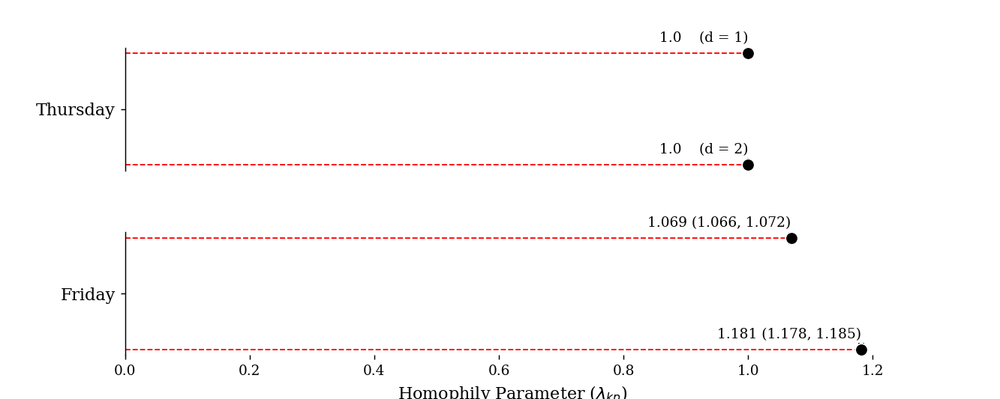

In [5]:
from multidynet.plots import plot_lambda, plot_homophily_matrix

fig, axes = plot_homophily_matrix(
    model, q_alpha=0.05, figsize=(10, 4), layer_labels=layer_labels,
                         fontsize=12)

fig.savefig(
    '/Users/joshua/myworkspace/dynamic-multilayer-network-paper/images/'
    'primary_homophily2.png', dpi=300)


#fig.savefig(
#    '/Users/joshua/Documents/StatisticsUIUC/JournalClub/dynamic-network-research/images/'
#    'primary_homophily.png', dpi=300)

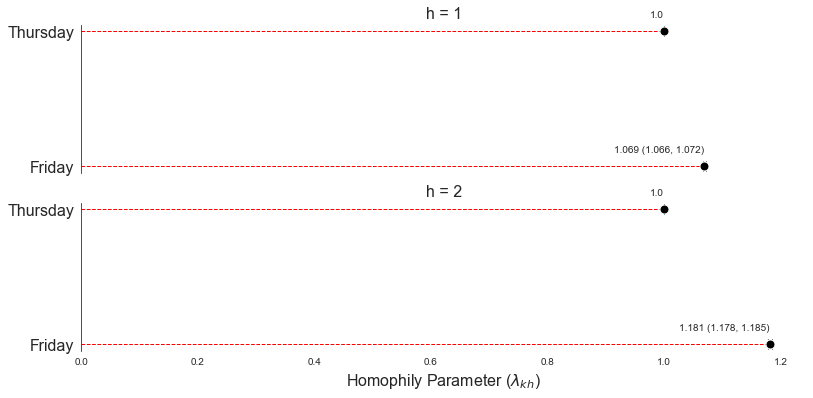

In [8]:
from multidynet.plots import plot_lambda

fig, axes = plot_lambda(model, q_alpha=0.05, layer_labels=layer_labels, fontsize=16,
                        figsize=(13, 6), include_gridlines=False)

fig.savefig(
    '/Users/joshua/myworkspace/jmlr-dynamic-multilayer-network-paper/images/'
    'primary_homophily_p.png', dpi=300, bbox_inches='tight')

In [29]:
Y[0].sum(axis=(1,2)) /(Y.shape[2] *(Y.shape[2] - 1))

array([0.02266726, 0.01491718, 0.02722815, 0.03686431, 0.03830458,
       0.0472549 , 0.01827784, 0.01567162, 0.03391516, 0.03357224,
       0.01622029, 0.01519152, 0.02777683, 0.01587737, 0.02211858,
       0.03250917, 0.0108021 , 0.0139227 , 0.01735194, 0.02184424,
       0.02561641, 0.04355132, 0.02496485, 0.02208429])

<IPython.core.display.Javascript object>


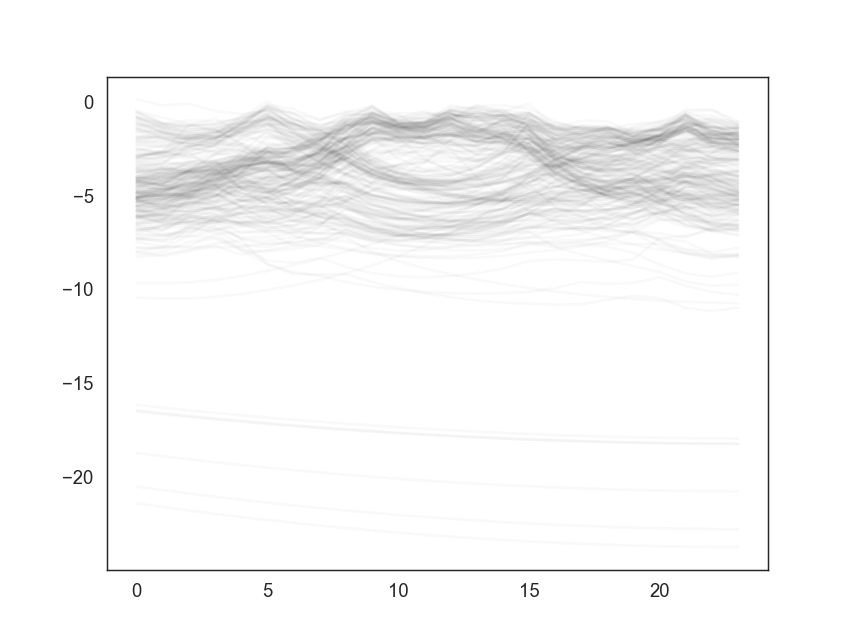

In [46]:
from multidynet.network_statistics import calculate_densities
dens = calculate_densities(Y)
plt.plot(model.delta_[0], c='k', alpha=0.025);

In [16]:
model2.reference_nodes_

array([158,   9])

In [26]:
np.where(grade == 'Teachers')

(array([ 42,  92,  93, 100, 123, 146, 147, 153, 195, 205]),)

In [27]:
grade[194]

'3A'

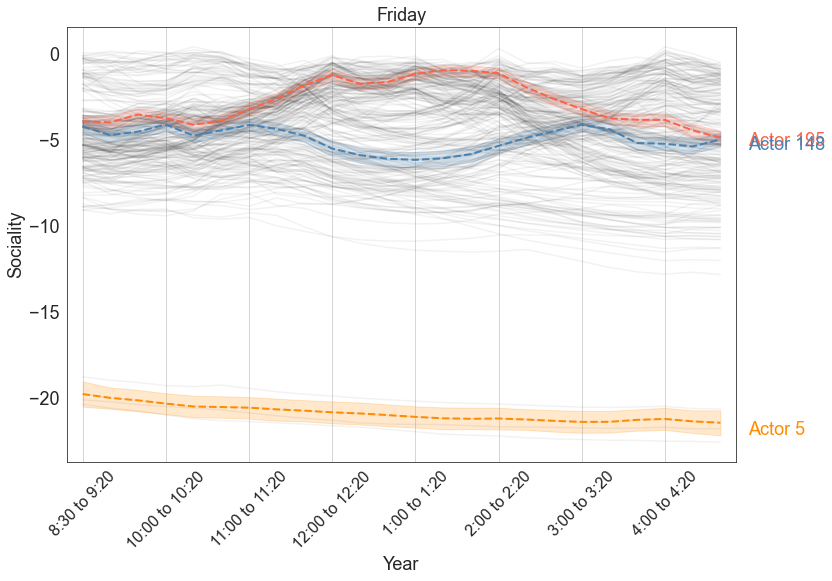

In [13]:
from multidynet.plots import plot_social_trajectories
from scipy.special import logit

k = 1

#ref_value = logit(Y[k].sum() / (Y.shape[1] * Y.shape[2] * (Y.shape[2] - 1))) / 2.
fig, ax = plot_social_trajectories(model, k=k, 
                 node_list=['Actor 5', 'Actor 195', 'Actor 148'],
                 ref_value=None, #ref_label=r'$\hat{\beta}_k$',
                 label_offset=0,
                 q_alpha=0.05, alpha=0.05, fill_alpha=0.2,
                 line_width=2,
                 node_colors=['darkorange', 'tomato', 'steelblue', 'forestgreen'], 
                 layer_label=layer_labels[k], xlabel='Year',
                 node_labels=['Actor {}'.format(i + 1) for i in range(Y.shape[2])],
                 figsize=(12, 8), fontsize=18)

ax.set_xticks([i for i in range(0, 24, 3)])
ax.set_xticklabels(time_labels[::3], rotation=45, fontsize=16)
ax.margins(x=0.025)
ax.tick_params(axis='y', labelsize=18)
ax.grid(axis='x')

fig.savefig('/Users/joshua/myworkspace/jmlr-dynamic-multilayer-network-paper/images/'
            'social_trajectories_school_friday.png', dpi=300, bbox_inches='tight')

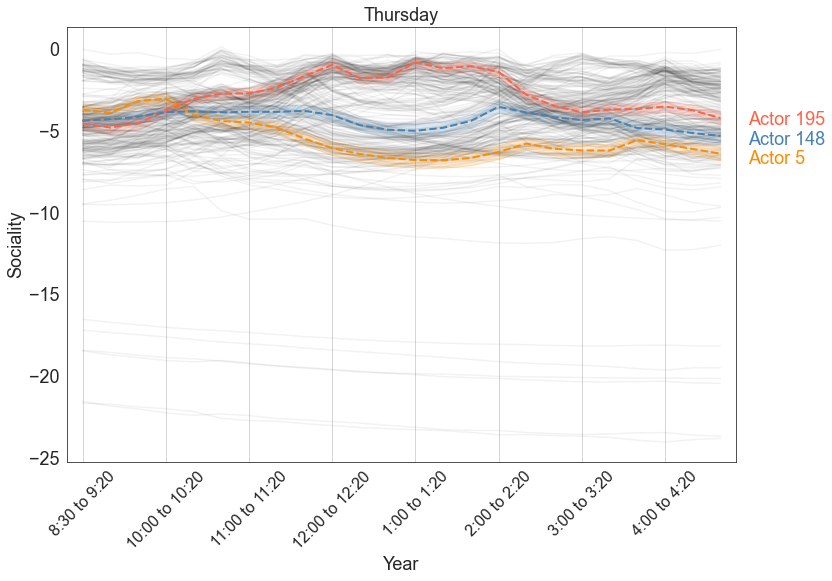

In [14]:
from multidynet.plots import plot_social_trajectories
from scipy.special import logit

k = 0

#ref_value = logit(Y[k].sum() / (Y.shape[1] * Y.shape[2] * (Y.shape[2] - 1))) / 2.
fig, ax = plot_social_trajectories(model, k=k, 
                 node_list=['Actor 5', 'Actor 195', 'Actor 148'],
                 ref_value=None, #ref_label=r'$\hat{\beta}_k$',
                 label_offset=0,
                 q_alpha=0.05, alpha=0.05, fill_alpha=0.2,
                 line_width=2,
                 node_colors=['darkorange', 'tomato', 'steelblue', 'forestgreen'], 
                 layer_label=layer_labels[k], xlabel='Year',
                 node_labels=['Actor {}'.format(i + 1) for i in range(Y.shape[2])],
                 figsize=(12, 8), fontsize=18)

ax.set_xticks([i for i in range(0, 24, 3)])
ax.set_xticklabels(time_labels[::3], rotation=45, fontsize=16)
ax.margins(x=0.025)
ax.tick_params(axis='y', labelsize=18)
ax.grid(axis='x')

fig.savefig('/Users/joshua/myworkspace/jmlr-dynamic-multilayer-network-paper/images/'
            'social_trajectories_school_thursday.png', dpi=300, bbox_inches='tight')

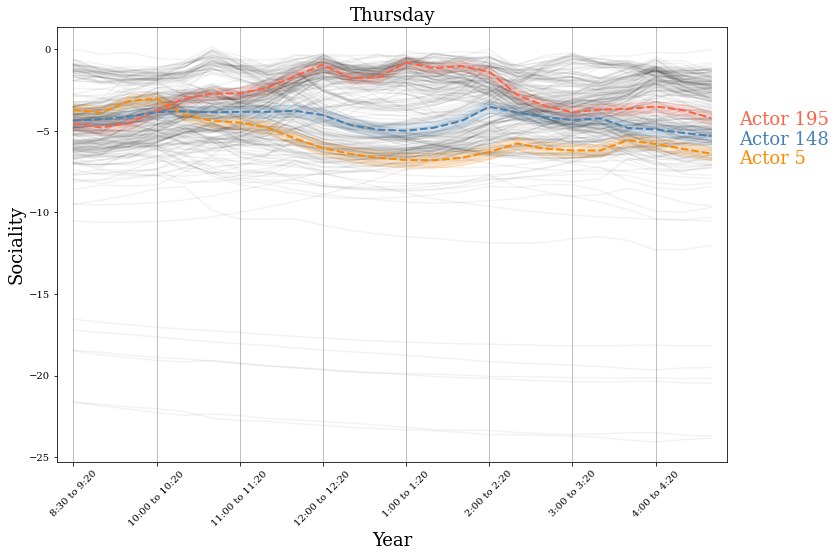

In [11]:
from multidynet.plots import plot_social_trajectories
from scipy.special import logit

k = 0

#ref_value = logit(Y[k].sum() / (Y.shape[1] * Y.shape[2] * (Y.shape[2] - 1))) / 2.
fig, ax = plot_social_trajectories(model, k=k, 
                 node_list=['Actor 5', 'Actor 195', 'Actor 148'],
                 ref_value=None, #ref_label=r'$\hat{\beta}_k$',
                 label_offset=0,
                 q_alpha=0.05, alpha=0.05, fill_alpha=0.2,
                 line_width=2,
                 node_colors=['darkorange', 'tomato', 'steelblue', 'forestgreen'], 
                 layer_label=layer_labels[k], xlabel='Year',
                 node_labels=['Actor {}'.format(i + 1) for i in range(Y.shape[2])],
                 figsize=(12, 8), fontsize=18)

ax.set_xticks([i for i in range(0, 24, 3)])
ax.set_xticklabels(time_labels[::3], rotation=45)
ax.margins(x=0.025)
ax.grid(axis='x')

fig.savefig('/Users/joshua/myworkspace/dynamic-multilayer-network-paper/images/'
            'social_trajectories_school_thursday.png', dpi=300, bbox_inches='tight')

In [14]:
grade[4]

'5B'

In [11]:
np.where(grade == 'Teachers')

(array([ 42,  92,  93, 100, 123, 146, 147, 153, 195, 205]),)

<IPython.core.display.Javascript object>


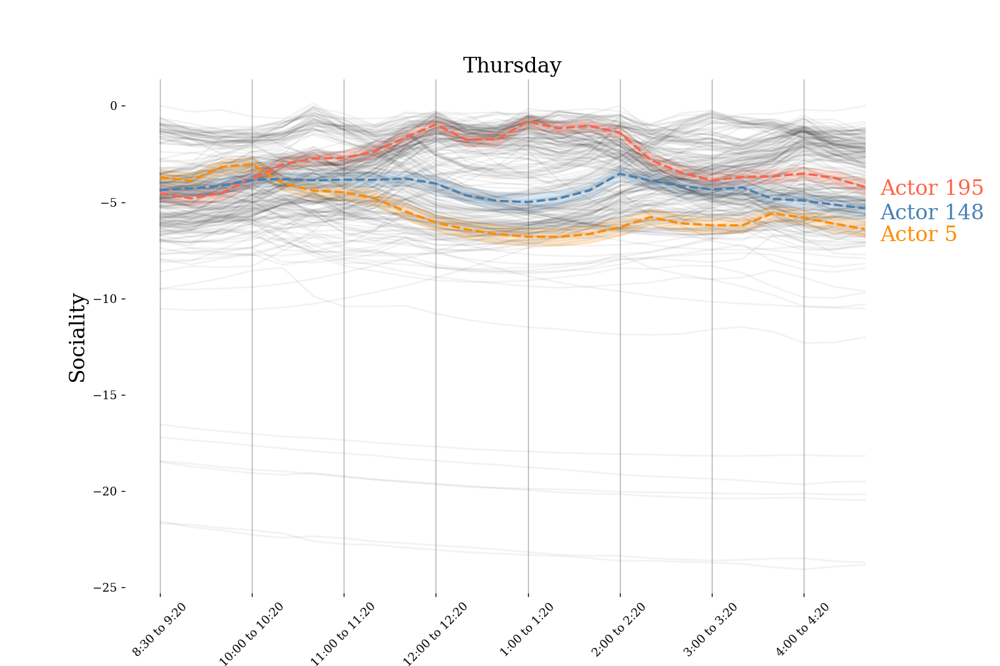

In [23]:
from multidynet.plots import plot_social_trajectories
from scipy.special import logit

k = 0

#ref_value = logit(Y[k].sum() / (Y.shape[1] * Y.shape[2] * (Y.shape[2] - 1))) / 2.
fig, ax = plot_social_trajectories(model, k=k, 
                 node_list=['Actor 5', 'Actor 195', 'Actor 148'],
                 ref_value=None, #ref_label=r'$\hat{\beta}_k$',
                 label_offset=-.5,
                 q_alpha=0.05, alpha=0.05, fill_alpha=0.2,
                 line_width=2,
                 node_colors=['darkorange', 'tomato', 'steelblue', 'forestgreen'], 
                 layer_label=layer_labels[k], xlabel='Year',
                 node_labels=['Actor {}'.format(i + 1) for i in range(Y.shape[2])],
                 figsize=(12, 8), fontsize=18)

ax.set_xticks([i for i in range(0, 24, 3)])
ax.set_xticklabels(time_labels[::3], rotation=45)
ax.grid(axis='x')

fig.savefig('/Users/joshua/myworkspace/dynamic-multilayer-network-paper/images/'
            'social_trajectories_school_thursday.png', dpi=300)

<IPython.core.display.Javascript object>


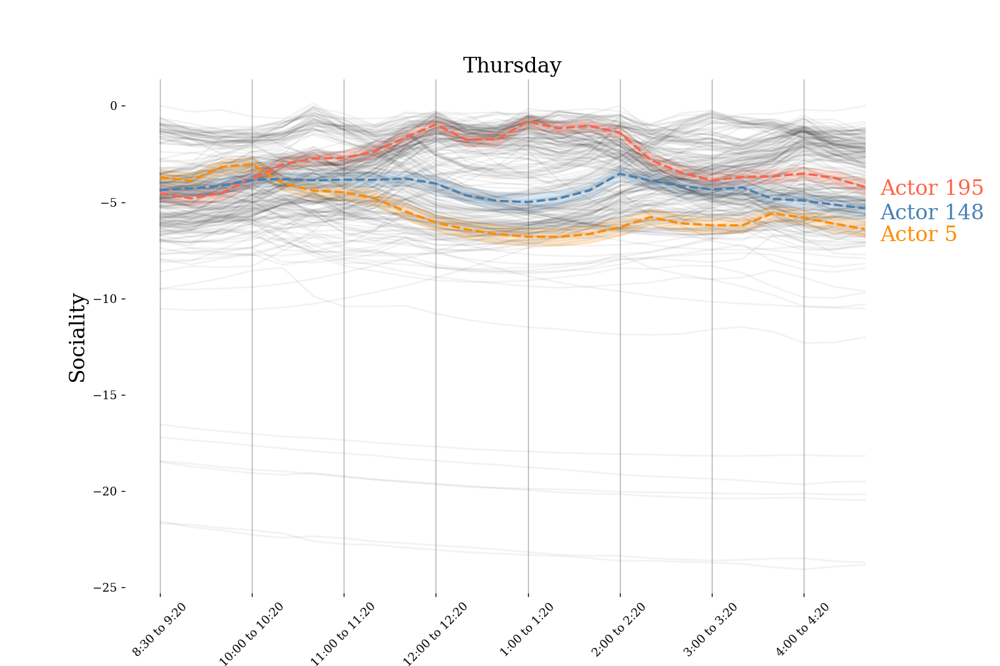

In [24]:
from multidynet.plots import plot_social_trajectories
from scipy.special import logit

k = 0

ref_value = logit(Y[k].sum() / (Y.shape[1] * Y.shape[2] * (Y.shape[2] - 1))) / 2.
fig, ax = plot_social_trajectories(model, k=k, fontsize=18,
                 node_list=['Actor 5', 'Actor 195', 'Actor 148'],
                 ref_value=None, #ref_label=r'$\hat{\beta}_k$',
                 label_offset=-.5,
                 q_alpha=0.05, alpha=0.05, fill_alpha=0.2,
                 line_width=2,
                 node_colors=['darkorange', 'tomato', 'steelblue', 'forestgreen'], 
                 layer_label=layer_labels[k], xlabel='Year',
                 node_labels=['Actor {}'.format(i + 1) for i in range(Y.shape[2])],
                 figsize=(12, 8))

ax.set_xticks([i for i in range(0, 24, 3)])
ax.set_xticklabels(time_labels[::3], rotation=45)
ax.grid(axis='x')

fig.savefig('/Users/joshua/Documents/StatisticsUIUC/JournalClub/dynamic-network-research/'
            'images/social_trajectories_school_thursday.png', dpi=300)

In [75]:
grade[194]

'3A'

In [76]:
gender[194]

'M'

<IPython.core.display.Javascript object>


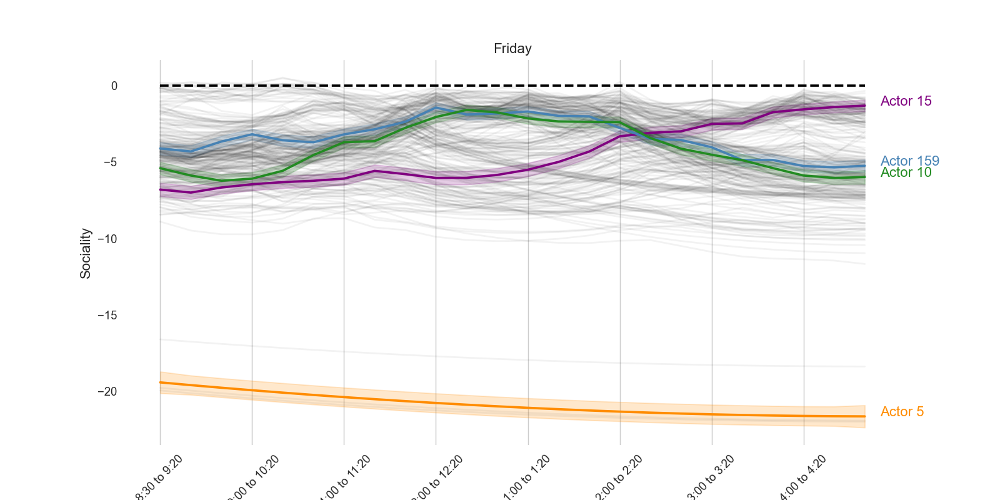

In [27]:
from multidynet.plots import plot_social_trajectories

k = 1
fig, ax = plot_social_trajectories(model, k=k, 
                 node_list=['Actor 5', 'Actor 15', 'Actor 159', 'Actor 10'],
                 label_offset=-.5,
                 q_alpha=0.05, alpha=0.05, fill_alpha=0.2,
                 line_width=2,
                 node_colors=['darkorange', 'purple', 'steelblue', 'forestgreen'], 
                 layer_label=layer_labels[k], xlabel='Year',
                 node_labels=['Actor {}'.format(i + 1) for i in range(Y.shape[2])],
                 figsize=(12, 6))

ax.set_xticks([i for i in range(0, 24, 3)])
ax.set_xticklabels(time_labels[::3], rotation=45)
ax.grid(axis='x')

<IPython.core.display.Javascript object>


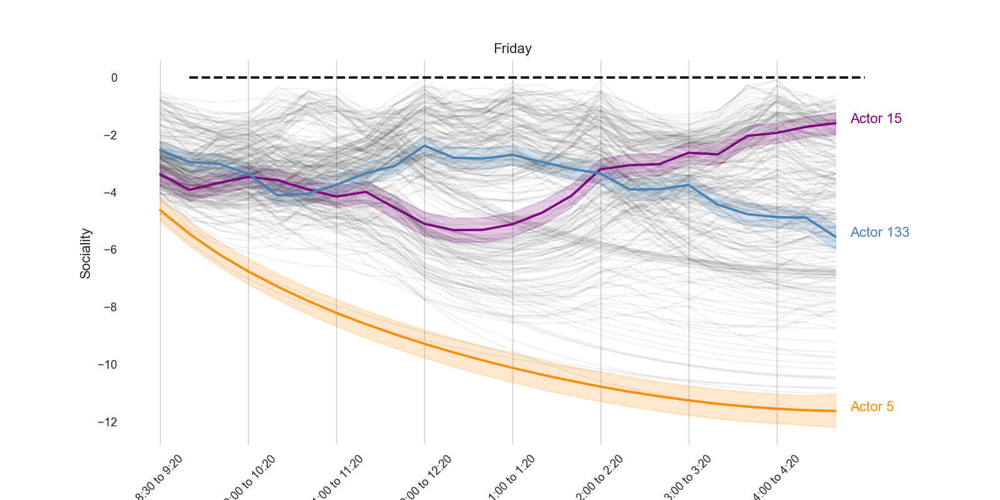

In [14]:
from multidynet.plots import plot_social_trajectories

k = 1
fig, ax = plot_social_trajectories(model, k=k, 
                 #node_list=[4, 15, 133], 
                 node_list=['Actor 5', 'Actor 15', 'Actor 133'],
                 label_offset=-.5,
                 q_alpha=0.05, alpha=0.05, fill_alpha=0.2,
                 line_width=2,
                 node_colors=['darkorange', 'purple', 'steelblue'], 
                 #node_labels=np.arange(Y.shape[2]),
                 layer_label=layer_labels[k], xlabel='Year',
                 node_labels=['Actor {}'.format(i + 1) for i in range(Y.shape[2])],
                 figsize=(12, 6))

ax.set_xticks([i for i in range(0, 24, 3)])
ax.set_xticklabels(time_labels[::3], rotation=45)
ax.grid(axis='x')

In [97]:
from multidynet.plots import make_network_animation

make_network_animation('friday_new.gif', Y, model.X_, X_sigma=model.X_sigma_,
                       k=0, z=grade, tau_sq=model.tau_sq_, normalize=False,
                  size=50, with_labels=True, font_size=8, 
                  edge_width=0.3, figsize=(10, 10), layer_labels=layer_labels, time_labels=time_labels,
                  title_fmt='{} from {}')


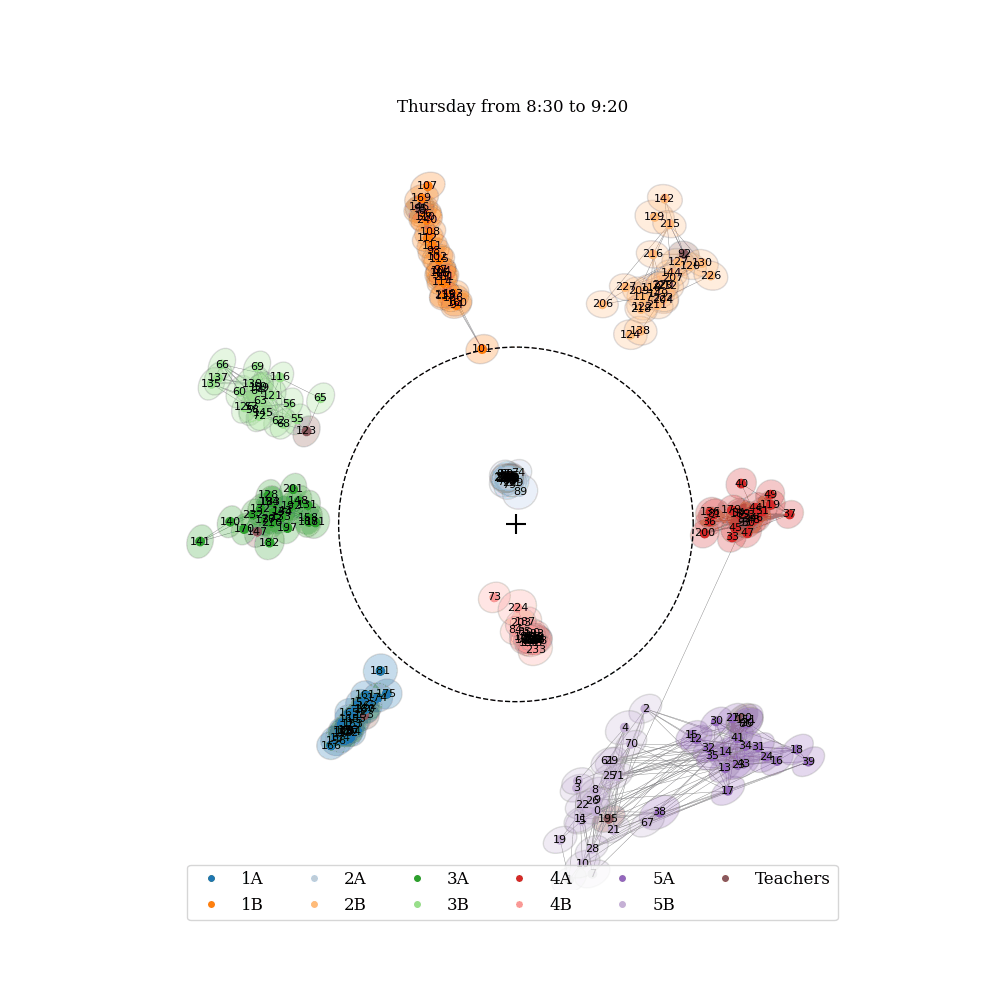

In [40]:
show_gif('thursday_new.gif')

In [62]:
grade[101]

'1B'

<IPython.core.display.Javascript object>


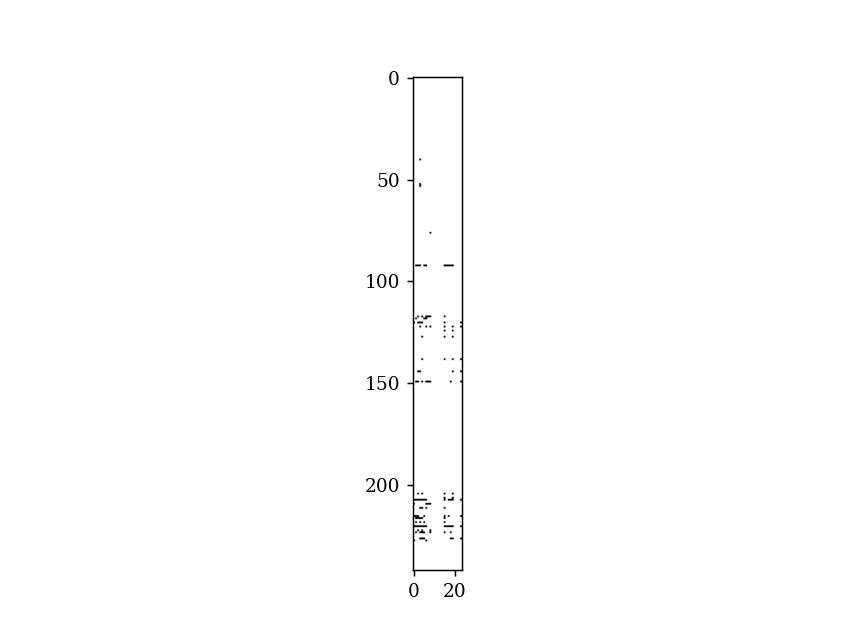

In [14]:
from dynetlsm.plots import plot_adjacency_matrix

plt.imshow(Y[0, :, 130].T, cmap=plt.cm.Greys)


<IPython.core.display.Javascript object>


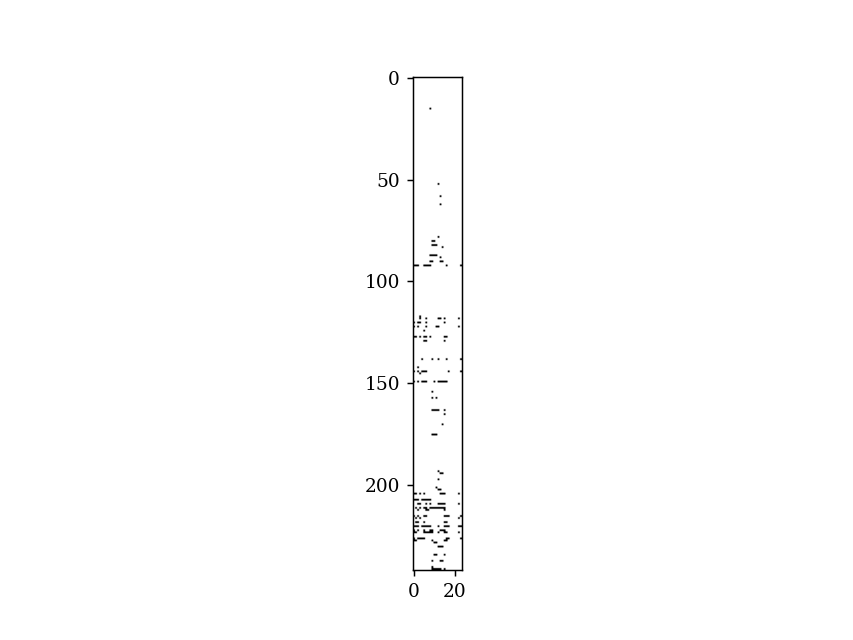

In [15]:
from dynetlsm.plots import plot_adjacency_matrix

plt.imshow(Y[1, :, 130].T, cmap=plt.cm.Greys)


In [37]:
from multidynet.plots import make_network_animation

make_network_animation('friday3.gif', Y, model.Z_, k=1, z=grade, tau_sq=model.tau_sq_, 
                       X_sigma=model.Z_sigma_, normalize=False,
                  size=100, with_labels=True, font_size=8, 
                  edge_width=0.3, figsize=(10, 10), layer_labels=layer_labels, time_labels=time_labels,
                  title_fmt='{} from {}')


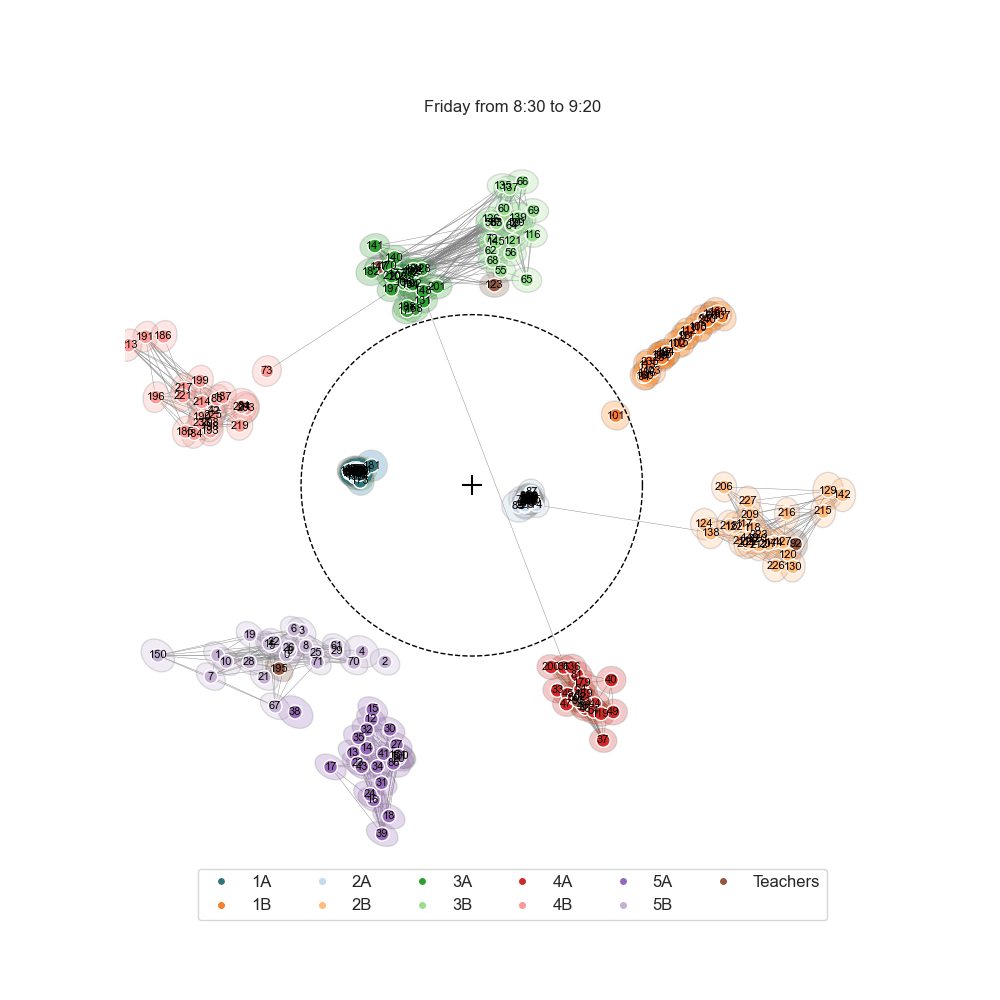

In [38]:
show_gif('friday3.gif')

In [52]:
k = 1
t = 9

male_id = np.arange(Y.shape[2])[gender == 'M']
female_id = np.arange(Y.shape[2])[gender == 'F']

y_male = Y[k,t][male_id[:, np.newaxis], male_id[np.newaxis, :]]
y_female = Y[k,t][female_id[:, np.newaxis], female_id[np.newaxis, :]]
y_cross = Y[k,t][male_id[:, np.newaxis], female_id[np.newaxis, :]]

In [53]:
y_cross.sum() / np.prod(y_cross.shape)

0.03237577639751553

In [54]:
y_male.sum() / np.prod(y_male.shape)

0.05595463137996219

In [55]:
y_female.sum() / np.prod(y_female.shape)

0.03380102040816327

((0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (0.6823529411764706, 0.7803921568627451, 0.9098039215686274),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (1.0, 0.7333333333333333, 0.47058823529411764),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.596078431372549, 0.8745098039215686, 0.5411764705882353),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (1.0, 0.596078431372549, 0.5882352941176471),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.7725490196078432, 0.6901960784313725, 0.8352941176470589),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.7686274509803922, 0.611764705882353, 0.5803921568627451),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.9686274509803922, 0.7137254901960784, 0.8235294117647058),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (0.7803921568627451, 0.7803921568627451, 0.7803921568627451),
 (0.7372549019607844, 0.74117647

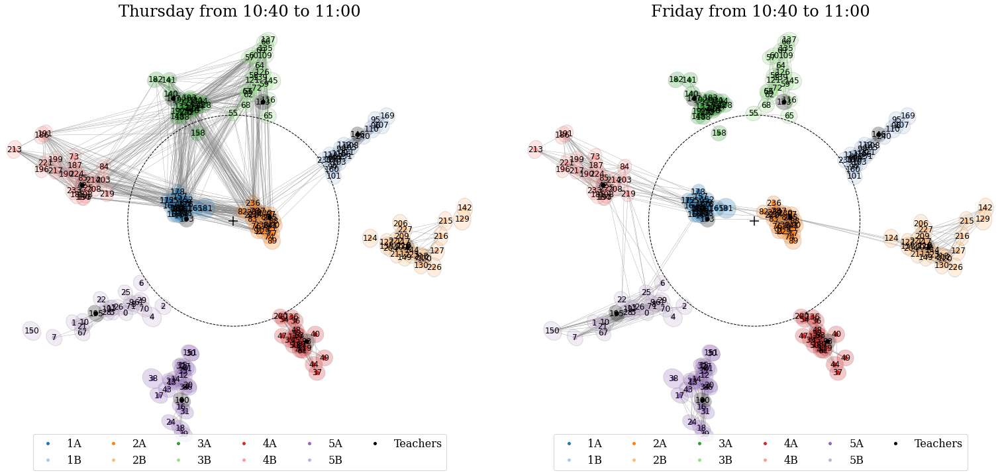

In [11]:
from multidynet.plots import plot_network, normal_contour
from dynetlsm.plots import get_colors

t = 5
k = 0

colors = get_colors(np.arange(10))
colors[1], colors[2] = colors[2], colors[1]
colors[10] = 'black'

fig, ax = plt.subplots(figsize=(22, 10), ncols=2, sharey=True)

plot_network(Y[k, t], model.Z_[t], X_sigma=model.Z_sigma_[t],
                       tau_sq=model.tau_sq_, normalize=False,
                       z=grade, colors=colors,
                      size=50, with_labels=True, font_size=12,
                      edge_width=0.3, figsize=(10, 10), legend_fontsize=16, 
                      ax=ax[0])
ax[0].set_title('{} from {}'.format(layer_labels[k], time_labels[t]), fontsize=24)

k = 1
plot_network(Y[k, t], model.Z_[t], X_sigma=model.Z_sigma_[t],
                       tau_sq=model.tau_sq_, normalize=False,
                       z=grade, colors=colors,
                      size=50, with_labels=True, font_size=12,
                      edge_width=0.3, figsize=(10, 10), legend_fontsize=16,
                      ax=ax[1])
ax[1].set_title('{} from {}'.format(layer_labels[k], time_labels[t]), fontsize=24)

fig.tight_layout()
fig.savefig('/Users/joshua/myworkspace/dynamic-multilayer-network-paper/images/'
            'primary_latent_space.png', dpi=300, bbox_inches='tight')

In [11]:
from sklearn.preprocessing import LabelEncoder

encoder = LabelEncoder().fit(grade)
encoder.classes_

array(['1A', '1B', '2A', '2B', '3A', '3B', '4A', '4B', '5A', '5B',
       'Teachers'], dtype=object)

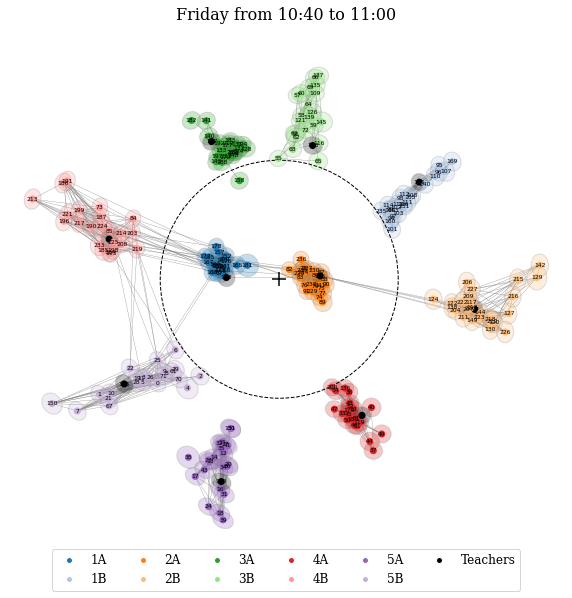

In [17]:
from multidynet.plots import plot_network, normal_contour

t = 5
k = 1

fig, ax = plot_network(Y[k, t], model.Z_[t], X_sigma=model.Z_sigma_[t],
                       tau_sq=model.tau_sq_, normalize=False,
                       z=grade, colors=colors,
                      size=50, with_labels=True, font_size=6,
                      edge_width=0.3, figsize=(10, 10))
ax.set_title('{} from {}'.format(layer_labels[k], time_labels[t]), fontsize=16)

fig.savefig('/Users/joshua/myworkspace/dynamic-multilayer-network-paper/images/'
            'primary_latent_friday_new', dpi=300, bbox_inches='tight')

<IPython.core.display.Javascript object>


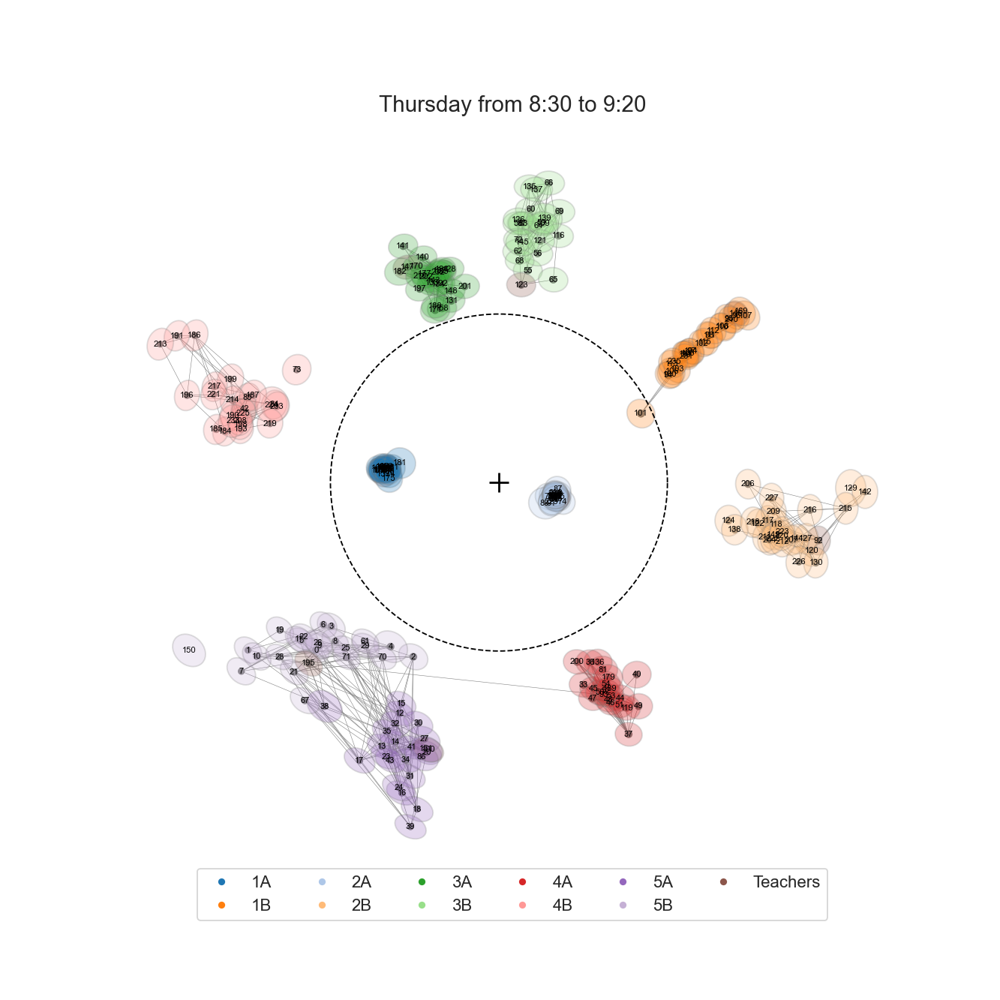

In [36]:
from multidynet.plots import plot_network, normal_contour
from sklearn.preprocessing import LabelEncoder
from dynetlsm.plots import get_colors

t = 0
k = 0

fig, ax = plot_network(Y[k, t], model.Z_[t], delta=model.delta_[k,t],
                       X_sigma=model.Z_sigma_[t],
                       tau_sq=model.tau_sq_, normalize=False,
                       z=grade, 
                       size=25, with_labels=True, font_size=6,
                       edge_width=0.3, figsize=(10, 10))
ax.set_title('{} from {}'.format(layer_labels[k], time_labels[t]), fontsize=16)



encoder = LabelEncoder().fit(grade)
colors = get_colors(grade.ravel())
node_color = colors[encoder.transform(grade)]
X_mean = model.X_[t]
X_sigma = model.X_sigma_[t]

#fig, ax = plt.subplots(figsize=(10, 6))
#ax.scatter(X_mean[:, 0], X_mean[:, 1], s=10, marker='.', color='k')

#for i in range(X_mean.shape[0]):
#    normal_contour(X_mean[i], X_sigma[i], edgecolor=node_color[i], facecolor=node_color[i],
#                   alpha=0.25, ax=ax, n_std=[2])
    
#fig.savefig('/Users/joshua/myworkspace/dynamic-multilayer-network-paper/images/'
#            'primary_latent_friday', dpi=300)
#fig.savefig('/Users/joshua/Documents/StatisticsUIUC/JournalClub/dynamic-network-research/images/'
#            'primary_latent_friday', dpi=300)

#fig.savefig('/Users/joshua/test.pdf', dpi=300)

<IPython.core.display.Javascript object>


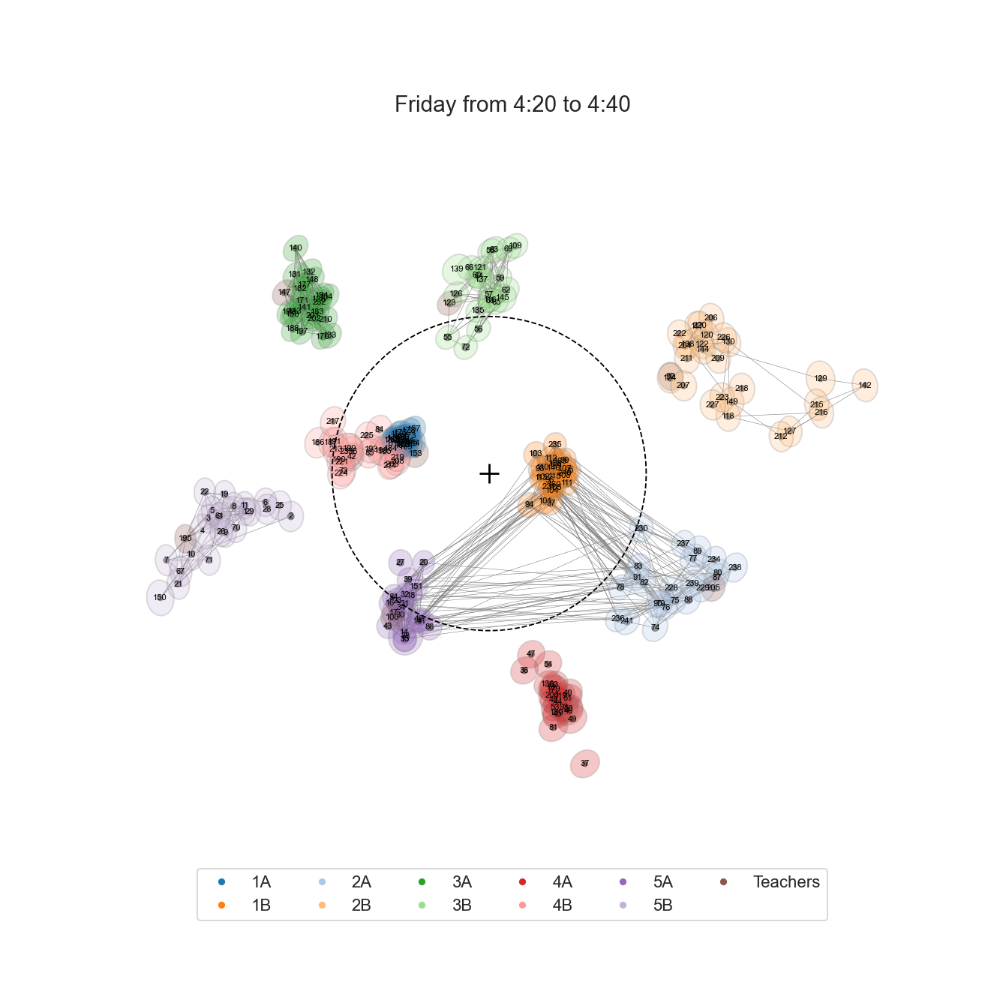

In [34]:
from multidynet.plots import plot_network, normal_contour
from sklearn.preprocessing import LabelEncoder
from dynetlsm.plots import get_colors

t = 22
k = 1

fig, ax = plot_network(Y[k, t], model.X_[t], delta=model.delta_[k,t],
                       X_sigma=model.X_sigma_[t],
                       tau_sq=model.tau_sq_, normalize=False,
                       z=grade, 
                       size=25, with_labels=True, font_size=6,
                       edge_width=0.3, figsize=(10, 10))
ax.set_title('{} from {}'.format(layer_labels[k], time_labels[t]), fontsize=16)



encoder = LabelEncoder().fit(grade)
colors = get_colors(grade.ravel())
node_color = colors[encoder.transform(grade)]
X_mean = model.X_[t]
X_sigma = model.X_sigma_[t]

#fig, ax = plt.subplots(figsize=(10, 6))
#ax.scatter(X_mean[:, 0], X_mean[:, 1], s=10, marker='.', color='k')

#for i in range(X_mean.shape[0]):
#    normal_contour(X_mean[i], X_sigma[i], edgecolor=node_color[i], facecolor=node_color[i],
#                   alpha=0.25, ax=ax, n_std=[2])
    
#fig.savefig('/Users/joshua/myworkspace/dynamic-multilayer-network-paper/images/'
#            'primary_latent_friday', dpi=300)
#fig.savefig('/Users/joshua/Documents/StatisticsUIUC/JournalClub/dynamic-network-research/images/'
#            'primary_latent_friday', dpi=300)

#fig.savefig('/Users/joshua/test.pdf', dpi=300)

<IPython.core.display.Javascript object>


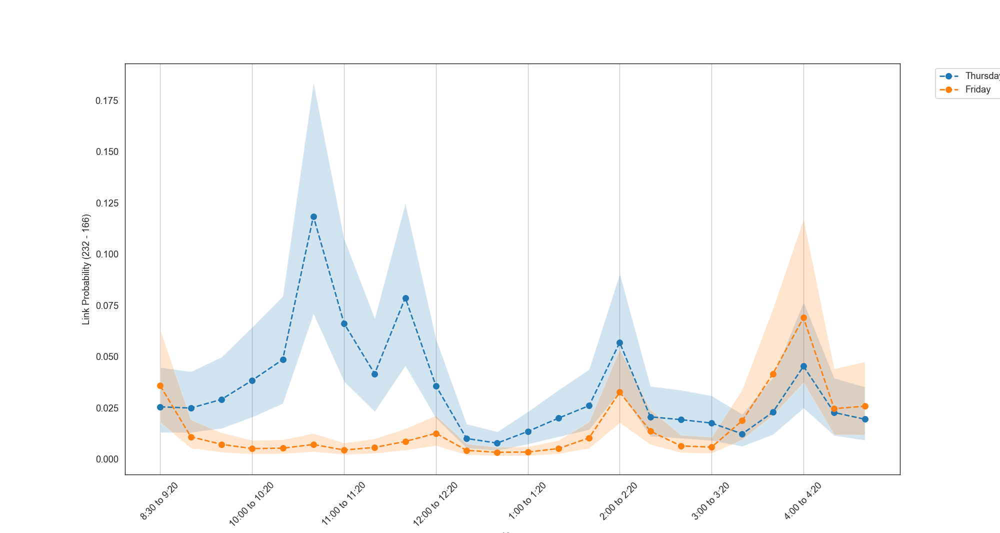

Text(0.5, 0, 'Hour')

In [50]:
from multidynet.plots import plot_pairwise_probabilities

horizon = 0
fig, ax = plot_pairwise_probabilities(model, 232, 166, horizon=horizon, 
                                      linestyle='o--', figsize=(15, 8),
                                      layer_labels=layer_labels)

ax.set_xticks([i for i in range(0, 24, 3)])
ax.set_xticklabels(
    time_labels[::3], rotation=45)
ax.grid(axis='x')
ax.set_xlabel('Hour')

<IPython.core.display.Javascript object>


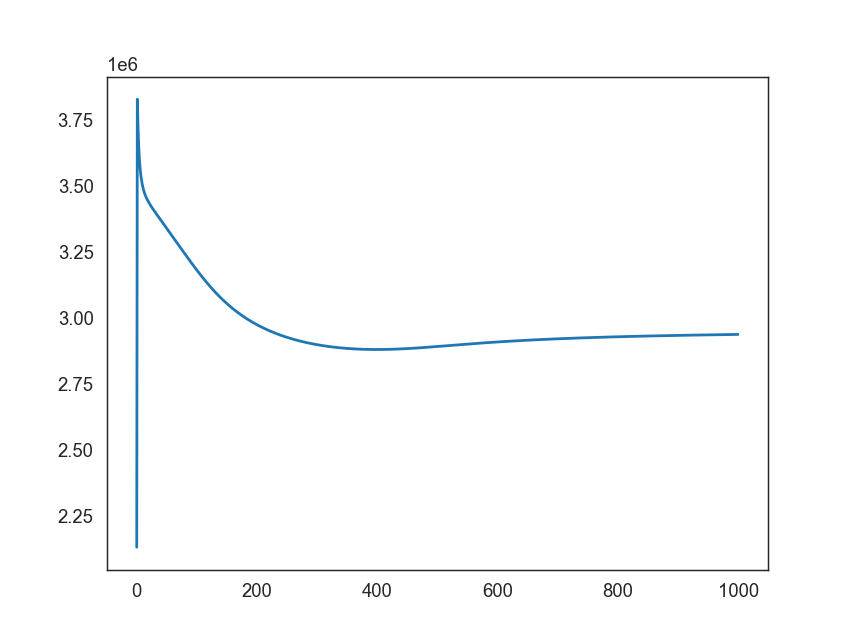

In [15]:
plt.plot(model.logp_)

<IPython.core.display.Javascript object>


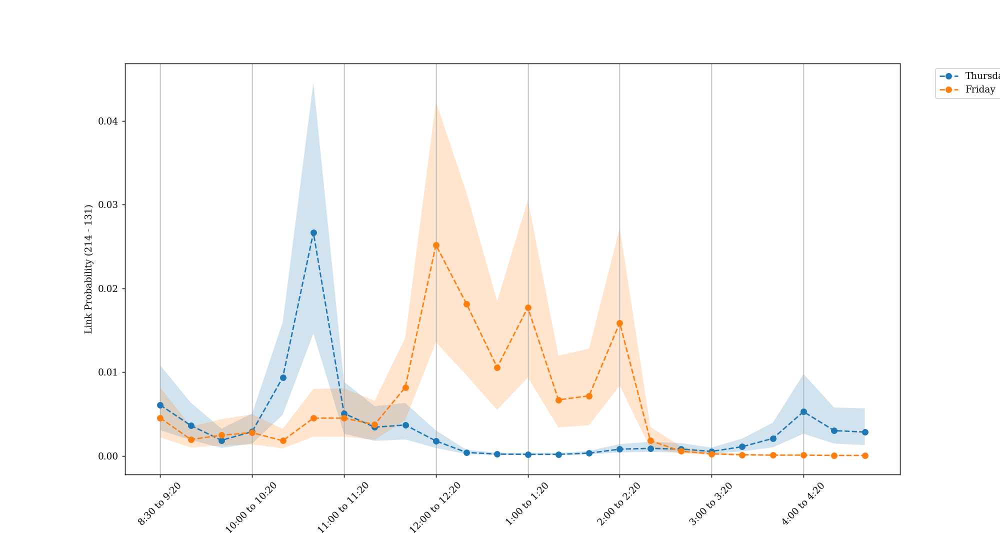

Text(0.5, 0, 'Hour')

In [20]:
from multidynet.plots import plot_pairwise_probabilities

horizon = 0
fig, ax = plot_pairwise_probabilities(model, 214, 131, horizon=horizon, 
                                      linestyle='o--', figsize=(15, 8),
                                      layer_labels=layer_labels)


ax.set_xticks([i for i in range(0, 24, 3)])
ax.set_xticklabels(time_labels[::3], rotation=45)
ax.grid(axis='x')
ax.set_xlabel('Hour')

In [15]:
from multidynet.gof import simulate_univariate_stats

stat_sim, stat_obs = simulate_univariate_stats(
    model, Y_obs=Y, stats=['branching_factor'], 
    sample_gssm=True,
    n_sims=250, random_state=1337)

In [16]:
import joblib

joblib.dump(stat_sim, open('stat_sim.pkl', 'wb'))
joblib.dump(stat_obs, open('stat_obs.pkl', 'wb'))

In [4]:
import joblib 

stat_sim = joblib.load(open('stat_sim.pkl', 'rb'))
stat_obs = joblib.load(open('stat_obs.pkl', 'rb'))

In [24]:
1.6 * 11

17.6

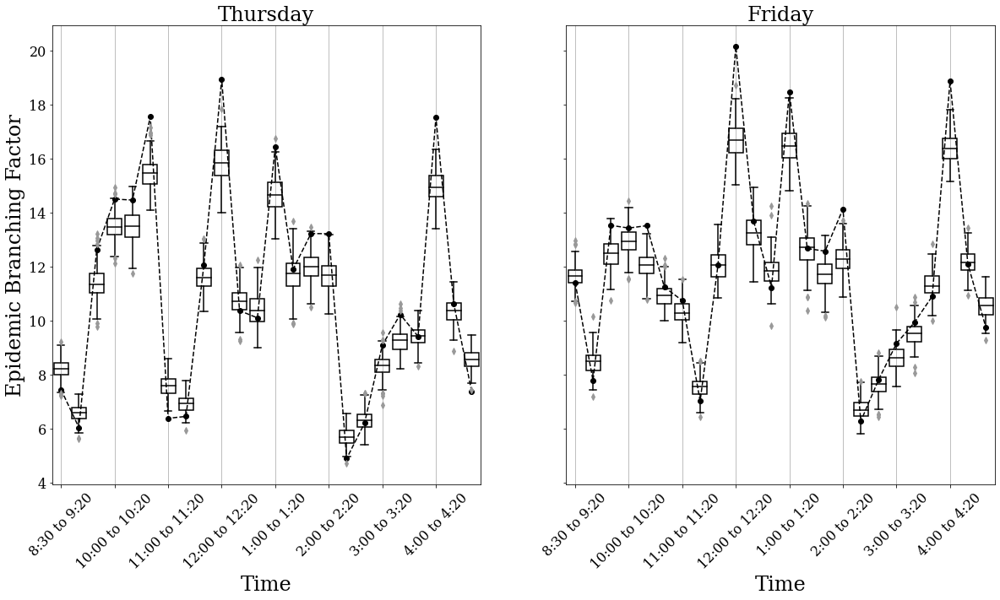

In [6]:
from multidynet.plots import plot_network_statistics

fig, ax = plot_network_statistics(stat_sim[0], stat_obs[0], 
                                  stat_label='Epidemic Branching Factor',
                                  time_labels=time_labels, 
                                  layer_labels=layer_labels, 
                                  time_step=3,
                                  #figsize=(1.6 * 12, 12), 
                                  #figsize=(1.6 * 11, 11),
                                  figsize=(20, 10),
                                  xlabel='Time')
fig.savefig('/Users/joshua/myworkspace/jmlr-dynamic-multilayer-network-paper/images/'
            'primary_branching_factor2.png',
             dpi=300, bbox_inches='tight')

<IPython.core.display.Javascript object>


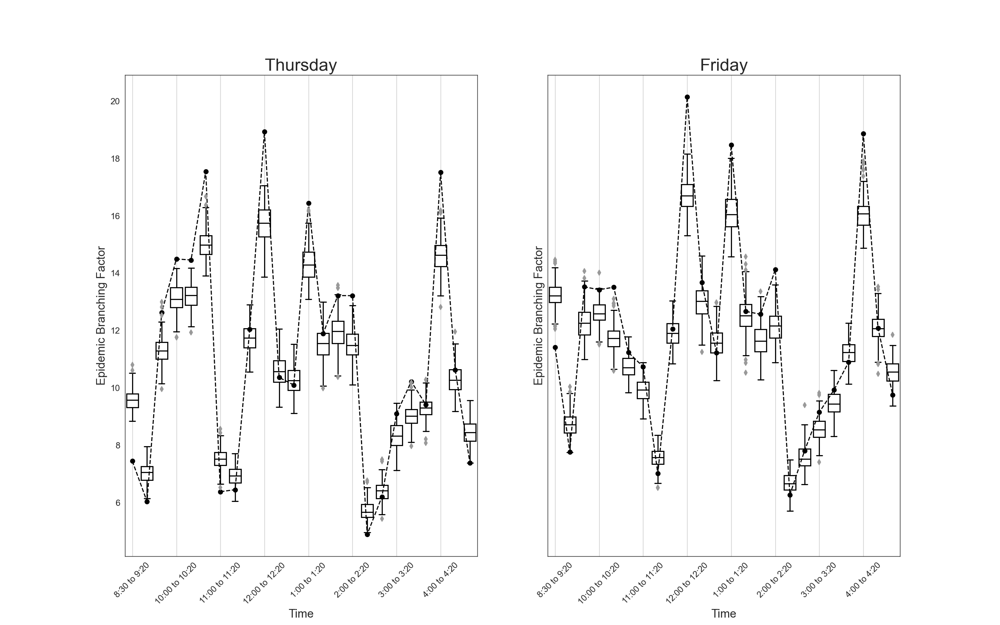

In [23]:
from multidynet.plots import plot_network_statistics

fig, ax = plot_network_statistics(stat_sim[0], stat_obs[0], 
                                  stat_label='Epidemic Branching Factor',
                                  time_labels=time_labels, 
                                  layer_labels=layer_labels, 
                                  time_step=3,
                                  figsize=(1.6 * 12, 12), 
                                  xlabel='Time')

#fig.savefig('/Users/joshua/myworkspace/dynamic-multilayer-network-paper/images/'
#            'primary_branching_factor.png',
#             dpi = 300)

In [26]:
len(time_labels)

24

In [27]:
stat_obs.shape

(1, 2, 24)

In [28]:
stat_sim.shape

(1, 2, 24, 100)

In [31]:
model.X_.shape

(24, 242, 2)

In [32]:
Y.shape

(2, 24, 242, 242)

In [8]:
?simulate_univariate_stats

In [35]:
np.quantile(stat_sim[0, 0, 5], q=[0.025, 0.975])

array([14.48575756, 16.37215592])

In [65]:
np.quantile(np.abs(stat_sim[0, 0, 5] - stat_sim[0, 1, 5]), q=[0.025, 0.975])

array([3.11462754, 5.77652481])

In [18]:
np.mean(stat_sim[0, 0, 5] - stat_sim[0, 1, 5])

4.329130198362314

In [28]:
C = model.X_.mean(axis=1)

In [35]:
model.X_[0] - C[0]

array([[ 9.14179283e-01, -2.97039831e+00],
       [ 6.23960778e-01, -3.69994286e+00],
       [ 1.43252300e+00, -1.88406379e+00],
       [ 7.07365649e-01, -2.72502948e+00],
       [ 1.21411029e+00, -2.08379923e+00],
       [ 7.58254869e-01, -3.07086242e+00],
       [ 7.16701265e-01, -2.64965635e+00],
       [ 8.70703100e-01, -3.63499455e+00],
       [ 8.96726980e-01, -2.74779088e+00],
       [ 9.18792113e-01, -2.85534365e+00],
       [ 7.65170323e-01, -3.53098521e+00],
       [ 7.43623019e-01, -3.05624108e+00],
       [ 1.97363063e+00, -2.20700270e+00],
       [ 2.27867141e+00, -2.51399998e+00],
       [ 2.28236935e+00, -2.33882819e+00],
       [ 1.92698765e+00, -2.16112627e+00],
       [ 2.82997433e+00, -2.43755964e+00],
       [ 2.30819017e+00, -2.75369084e+00],
       [ 3.03935253e+00, -2.31613381e+00],
       [ 5.28356665e-01, -3.27407737e+00],
       [ 2.51649174e+00, -2.03609296e+00],
       [ 1.08981268e+00, -3.16757586e+00],
       [ 7.60160034e-01, -2.90278612e+00],
       [ 2.

In [47]:
c = C[0].reshape(-1, 1)
(C[0] * model.lambda_[0] * C[0]).sum()

0.008691158715894657